## Important metrics and questions - HOTEL 3

### Import the libraries

In [3]:
import pandas as pd
import plotly.express as px
import numpy as np
import datetime

### ADR: average daily rate = rooms revenue / paid rooms
- ADR is a common metric in the hotel industry
- problem: we do not have enough data to calculate it, we miss all the bookings's per days 

### MCPB = marketing cost per booking 


- budget + daily_user tábla
- budget + date_picker tábla
- budget + booking tábla

- További táblák: google cost per click
- össze lehet hasonlítani, hogy melyik hirdetés hoz olcsóbban felhasználó/napi dátumválasztót/foglalást

#### budget + booking table: how much did it cost to get a booking


In [10]:
#budget: marketing spending in EUR by days
budget = pd.read_csv('./../Morgens_notebooks/HOTEL_3/Original_data/daily_ppc_budget_hotel_3.csv', sep=",")
budget.rename(columns = {'Unnamed: 0':'date'}, inplace = True)
budget['date'] = pd.to_datetime(budget['date'])
#Summarize the spending in a new column:
budget['total_spending'] = budget['daily_google_spend'] + budget['daily_microsoft_spend'] + budget['daily_meta_spend']
budget.head(5)

,date,daily_google_spend,daily_microsoft_spend,daily_meta_spend,total_spending
0,2024-09-18,103187,13076,28788,145051
1,2024-09-19,105303,19576,64102,188981
2,2024-09-20,104991,20604,73873,199468
3,2024-09-21,98337,12220,27476,138033
4,2024-09-22,113580,13024,36343,162947


#### Marketing cost per bookings

In [12]:
#booking_count: the number of bookings per days
booking_count = pd.read_csv('./../Morgens_notebooks/HOTEL_3/Clean_data/pivot_booking_count.csv', index_col=[0])

In [14]:
booking_count['total_paid_ count'] =  booking_count['Google'] + booking_count['META'] + booking_count['Microsoft']
booking_count.head(5)

,utc_date,0,Google,META,Microsoft,UNPAID,total_paid_ count
0,2024-09-18,2,9,0,0,2,9
1,2024-09-19,7,10,0,0,1,10
2,2024-09-20,3,7,0,0,2,7
3,2024-09-21,2,5,0,0,4,5
4,2024-09-22,2,7,1,0,4,8


In [16]:
#Join the budget table to the booking count:
budget_booking_count = pd.concat([budget, booking_count], axis=1 )
budget_booking_count['HUF/booking'] = budget_booking_count['total_spending'] / budget_booking_count['total_paid_ count']
budget_booking_count['HUF/booking'] = budget_booking_count['HUF/booking'].round(1)

budget_booking_count['GOOGLE/booking'] = budget_booking_count['daily_google_spend'] / budget_booking_count['Google']
budget_booking_count['GOOGLE/booking'] = budget_booking_count['GOOGLE/booking'].round(1)

budget_booking_count['Microsoft/booking'] = budget_booking_count['daily_microsoft_spend'] / budget_booking_count['Microsoft']
budget_booking_count['Microsoft/booking'] = budget_booking_count['Microsoft/booking'].round(1)

budget_booking_count['META/booking'] = budget_booking_count['daily_meta_spend'] / budget_booking_count['META']
budget_booking_count['META/booking'] = budget_booking_count['META/booking'].round(1)

In [18]:
budget_booking_count.head(50)

,date,daily_google_spend,daily_microsoft_spend,daily_meta_spend,total_spending,utc_date,0,Google,META,Microsoft,UNPAID,total_paid_ count,HUF/booking,GOOGLE/booking,Microsoft/booking,META/booking
0,2024-09-18,103187,13076,28788,145051,2024-09-18,2,9,0,0,2,9,16116.8,11465.2,inf,inf
1,2024-09-19,105303,19576,64102,188981,2024-09-19,7,10,0,0,1,10,18898.1,10530.3,inf,inf
2,2024-09-20,104991,20604,73873,199468,2024-09-20,3,7,0,0,2,7,28495.4,14998.7,inf,inf
3,2024-09-21,98337,12220,27476,138033,2024-09-21,2,5,0,0,4,5,27606.6,19667.4,inf,inf
4,2024-09-22,113580,13024,36343,162947,2024-09-22,2,7,1,0,4,8,20368.4,16225.7,inf,36343.0
5,2024-09-23,121915,14752,80416,217083,2024-09-23,5,10,0,0,4,10,21708.3,12191.5,inf,inf
6,2024-09-24,155007,15168,78181,248356,2024-09-24,4,7,1,0,2,8,31044.5,22143.9,inf,78181.0
7,2024-09-25,166705,13216,80310,260231,2024-09-25,3,11,0,0,2,11,23657.4,15155.0,inf,inf
8,2024-09-26,150061,11448,114300,275809,2024-09-26,2,5,1,0,3,6,45968.2,30012.2,inf,114300.0
9,2024-09-27,148829,13908,99764,262501,2024-09-27,3,8,0,0,0,8,32812.6,18603.6,inf,inf


In [26]:
# marketing cost / bookings for the whole period in total:
(budget_booking_count['total_spending'].sum()) / (budget_booking_count['total_paid_ count'].sum()) #12453 HUF / booking in total
# marketing cost / bookings for the whole period by the 3 sources:
budget_booking_count['daily_google_spend'].sum() / budget_booking_count['Google'].sum() #8850 HUF / booking Google
budget_booking_count['daily_microsoft_spend'].sum() / budget_booking_count['Microsoft'].sum() #41678 HUF / booking Microsoft
budget_booking_count['daily_meta_spend'].sum() / budget_booking_count['META'].sum() #201732 HUF / booking META

201732.42857142858

In [28]:
budget_booking_count['daily_meta_spend'].sum()

1412127

In [32]:
budget_booking_count['META'].sum()

7

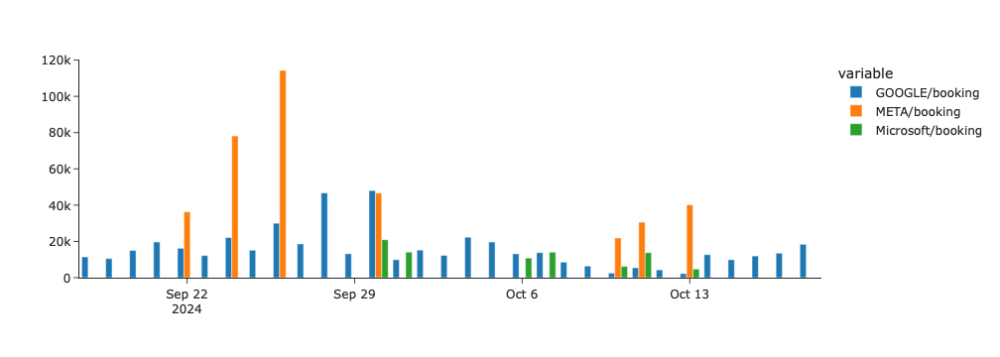

In [34]:
#Visualize it - marketing cost / bookings 
bar = px.bar (budget_booking_count, x='utc_date', y=['GOOGLE/booking', 'META/booking', 'Microsoft/booking'], barmode='group', template = 'simple_white')
bar.update_layout(xaxis_title=None, yaxis_title=None)
bar.show()


In [36]:
#Statistical features of the marketing costs:
budget_booking_count['HUF/booking'].describe()

count       31.000000
mean     22034.454839
std      14989.708818
min       2712.400000
25%      14441.650000
50%      20368.400000
75%      28051.000000
max      80018.000000
Name: HUF/booking, dtype: float64

In [38]:
#Statistical features of the marketing costs:
budget_booking_count['GOOGLE/booking'].describe()

count       31.000000
mean     15524.180645
std      10410.901157
min       2234.200000
25%      10222.950000
50%      13169.400000
75%      18504.700000
max      48017.700000
Name: GOOGLE/booking, dtype: float64

#### Marketing Cost Percentage (MCP)

In [40]:
#booking_sum: the sales of bookings per days
booking_sum= pd.read_csv('./../Morgens_notebooks/HOTEL_3/Clean_data/pivot_booking_sum.csv', index_col=[0])

In [42]:
booking_sum['total_paid_sum'] = booking_sum['Google'] + booking_sum['META'] + booking_sum['Microsoft']
booking_sum.head()

,utc_date,0,Google,META,Microsoft,UNPAID,total_paid_sum
0,2024-09-18,479625.0,1069413.4,0,0.0,282881.2,1069413.4
1,2024-09-19,902846.0,1167787.0,0,0.0,153355.0,1167787.0
2,2024-09-20,611530.1,1448908.0,0,0.0,190528.0,1448908.0
3,2024-09-21,547690.0,912772.8,0,0.0,598153.1,912772.8
4,2024-09-22,408080.0,1736360.0,257040,0.0,606400.4,1993400.0


In [44]:
#Join the budget table to the booking sum:
budget_booking_sum = pd.concat([budget, booking_sum], axis=1 )
budget_booking_sum.head(3)

,date,daily_google_spend,daily_microsoft_spend,daily_meta_spend,total_spending,utc_date,0,Google,META,Microsoft,UNPAID,total_paid_sum
0,2024-09-18,103187,13076,28788,145051,2024-09-18,479625.0,1069413.4,0,0.0,282881.2,1069413.4
1,2024-09-19,105303,19576,64102,188981,2024-09-19,902846.0,1167787.0,0,0.0,153355.0,1167787.0
2,2024-09-20,104991,20604,73873,199468,2024-09-20,611530.1,1448908.0,0,0.0,190528.0,1448908.0


In [46]:
#Calculate columns:
budget_booking_sum['percent_total'] = budget_booking_sum['total_spending'] / budget_booking_sum['total_paid_sum']*100
budget_booking_sum['percent_total'] = budget_booking_sum['percent_total'].round(0)

budget_booking_sum['percent_GOOGLE'] = budget_booking_sum['daily_google_spend'] / budget_booking_sum['Google']*100
budget_booking_sum['percent_GOOGLE'] = budget_booking_sum['percent_GOOGLE'].round(0)

budget_booking_sum['percent_Microsoft'] = budget_booking_sum['daily_microsoft_spend'] / budget_booking_sum['Microsoft']*100
budget_booking_sum['percent_Microsoft'] = budget_booking_sum['percent_Microsoft'].round(0)

budget_booking_sum['percent_META'] = budget_booking_sum['daily_meta_spend'] / budget_booking_sum['META']*100
budget_booking_sum['percent_META'] = budget_booking_sum['percent_META'].round(0)

In [48]:
budget_booking_sum.head()

,date,daily_google_spend,daily_microsoft_spend,daily_meta_spend,total_spending,utc_date,0,Google,META,Microsoft,UNPAID,total_paid_sum,percent_total,percent_GOOGLE,percent_Microsoft,percent_META
0,2024-09-18,103187,13076,28788,145051,2024-09-18,479625.0,1069413.4,0,0.0,282881.2,1069413.4,14.0,10.0,inf,inf
1,2024-09-19,105303,19576,64102,188981,2024-09-19,902846.0,1167787.0,0,0.0,153355.0,1167787.0,16.0,9.0,inf,inf
2,2024-09-20,104991,20604,73873,199468,2024-09-20,611530.1,1448908.0,0,0.0,190528.0,1448908.0,14.0,7.0,inf,inf
3,2024-09-21,98337,12220,27476,138033,2024-09-21,547690.0,912772.8,0,0.0,598153.1,912772.8,15.0,11.0,inf,inf
4,2024-09-22,113580,13024,36343,162947,2024-09-22,408080.0,1736360.0,257040,0.0,606400.4,1993400.0,8.0,7.0,inf,14.0


In [56]:
# marketing cost / bookings for the whole period in total:
budget_booking_sum['total_spending'].sum() / budget_booking_sum['total_paid_sum'].sum() * 100 #6,95%
# marketing cost / bookings for the whole period by the 3 sources:
budget_booking_sum['daily_google_spend'].sum() / budget_booking_sum['Google'].sum() * 100 #4,92% Google
budget_booking_sum['daily_microsoft_spend'].sum() / budget_booking_sum['Microsoft'].sum() * 100 #25,32% Microsoft
budget_booking_sum['daily_meta_spend'].sum() / budget_booking_sum['META'].sum() * 100 #123,7% META

123.69468730044856

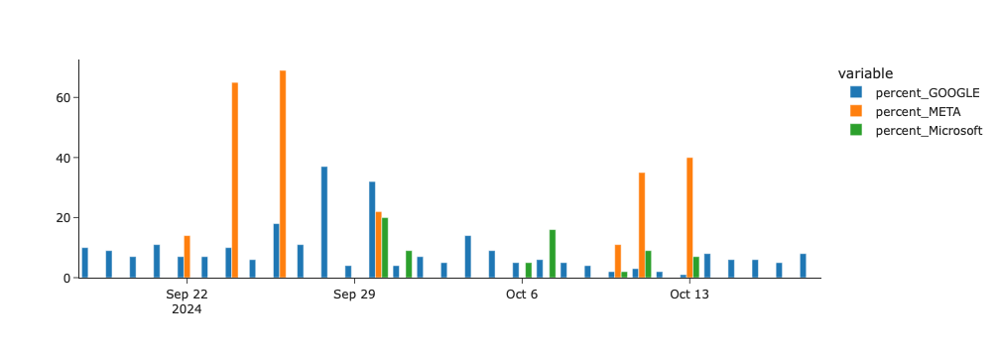

In [58]:
#Visualize it - marketing cost percentage
bar = px.bar (budget_booking_sum, x='utc_date',
              y=['percent_GOOGLE', 'percent_META', 'percent_Microsoft'],
              barmode='group',
              template = 'simple_white')
bar.update_layout(xaxis_title=None, yaxis_title=None)
bar.show()


## Average length of stay == nights


In [60]:
#search_EUR - nights
search_EUR = pd.read_csv('./../Morgens_notebooks/HOTEL_3/Original_data/search_EUR.csv', index_col=[0])

In [62]:
#New column: number of total guests
search_EUR['total_guests'] = search_EUR['adults'] + search_EUR['children']
#Categorize the number of total guests into 4 categories:
#family with/without children, family or group: group is equal or larger than 10 guest
#small family = 4 members in the family, large family = more than 4 members in the family

In [64]:
#Categorize the number of guests
search_EUR['guest_category'] = 'not_known'

In [66]:
search_EUR

,id,search_log_session_id,utc_datetime,lang_code,currency,arrival,departure,days,nights,adults,...,total_price_final,utc_date,Rate_EUR,Date_EUR_HUF,total_price_HUF,lead_time,lead_time_numbers,lead_time_days,total_guests,guest_category
0,129540,4260,2024-09-18 00:11:03,hu,HUF,2024-10-18,2024-10-20,3,2,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days,2592000000000000,30,2,not_known
1,129541,4260,2024-09-18 00:11:55,hu,HUF,2024-10-18,2024-10-20,3,2,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days,2592000000000000,30,2,not_known
2,129542,4260,2024-09-18 00:12:48,hu,HUF,2024-10-18,2024-10-20,3,2,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days,2592000000000000,30,2,not_known
3,129543,4261,2024-09-18 01:14:30,hu,HUF,2024-11-11,2024-11-14,4,3,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,54 days,4665600000000000,54,2,not_known
4,129544,4261,2024-09-18 01:16:46,hu,HUF,2024-11-11,2024-11-14,4,3,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,54 days,4665600000000000,54,2,not_known
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21650,163179,29077,2024-10-18 21:17:59,hu,HUF,2024-12-15,2024-12-17,3,2,2,...,0.0,2024-10-18,400.05,2024-10-18,0.0,58 days,5011200000000000,58,4,not_known
21651,163180,29077,2024-10-18 21:19:21,hu,HUF,2025-01-04,2025-01-06,3,2,2,...,0.0,2024-10-18,400.05,2024-10-18,0.0,78 days,6739200000000000,78,4,not_known
21652,163525,29424,2024-10-18 21:59:06,hu,HUF,2024-11-16,2024-11-18,3,2,2,...,0.0,2024-10-18,400.05,2024-10-18,0.0,29 days,2505600000000000,29,4,not_known
21653,163526,29424,2024-10-18 21:59:10,hu,HUF,2024-11-16,2024-11-18,3,2,2,...,0.0,2024-10-18,400.05,2024-10-18,0.0,29 days,2505600000000000,29,4,not_known


In [68]:
for i in range(len(search_EUR)):
    if (search_EUR.iloc[i, 20] >= 10) & (search_EUR.iloc[i, 10] == 0): #guests are more than 10 guests without children
        search_EUR.iloc[i, 21] = 'group without children'
        
    elif (search_EUR.iloc[i, 20] >= 10) & (search_EUR.iloc[i, 10] != 0): #guests are more than 10 guests with children
        search_EUR.iloc[i, 21] = 'group with children'
        
    elif (search_EUR.iloc[i, 20] < 5) & (search_EUR.iloc[i, 10] == 0): #family is less than 10 guests without children
        search_EUR.iloc[i, 21] = 'small family without children'

    elif (search_EUR.iloc[i, 20] < 5) & (search_EUR.iloc[i, 10] != 0): #family is less than 10 guests with children
        search_EUR.iloc[i, 21] = 'small family with children'

    elif (search_EUR.iloc[i, 20] < 10) & (search_EUR.iloc[i, 20] >= 5) & (search_EUR.iloc[i, 10] == 0): #family is less than 10 guests without children
        search_EUR.iloc[i, 21] = 'large family without children'

    elif (search_EUR.iloc[i, 20] < 10) & (search_EUR.iloc[i, 20] >= 5) & (search_EUR.iloc[i, 10] != 0): #family is less than 10 guests with children
        search_EUR.iloc[i, 21] = 'large family with children'
        

In [70]:
search_EUR.head(5)

,id,search_log_session_id,utc_datetime,lang_code,currency,arrival,departure,days,nights,adults,...,total_price_final,utc_date,Rate_EUR,Date_EUR_HUF,total_price_HUF,lead_time,lead_time_numbers,lead_time_days,total_guests,guest_category
0,129540,4260,2024-09-18 00:11:03,hu,HUF,2024-10-18,2024-10-20,3,2,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days,2592000000000000,30,2,small family without children
1,129541,4260,2024-09-18 00:11:55,hu,HUF,2024-10-18,2024-10-20,3,2,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days,2592000000000000,30,2,small family without children
2,129542,4260,2024-09-18 00:12:48,hu,HUF,2024-10-18,2024-10-20,3,2,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days,2592000000000000,30,2,small family without children
3,129543,4261,2024-09-18 01:14:30,hu,HUF,2024-11-11,2024-11-14,4,3,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,54 days,4665600000000000,54,2,small family without children
4,129544,4261,2024-09-18 01:16:46,hu,HUF,2024-11-11,2024-11-14,4,3,2,...,0.0,2024-09-18,394.47,2024-09-18,0.0,54 days,4665600000000000,54,2,small family without children


In [82]:
len(search_EUR[search_EUR['guest_category'] == 'group with children']) #55
len(search_EUR[search_EUR['guest_category'] == 'group without children']) #7
len(search_EUR[search_EUR['guest_category'] == 'small family with children']) #4642
len(search_EUR[search_EUR['guest_category'] == 'small family without children']) #1594
len(search_EUR[search_EUR['guest_category'] == 'large family with children']) #770
len(search_EUR[search_EUR['guest_category'] == 'large family without children']) #235


235

In [86]:
search_EUR['adults'].describe() #between 1 and 13, most common is 2
search_EUR['children'].describe() #between 1 and 6, most common 0

count    21655.000000
mean         0.389979
std          0.753111
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          6.000000
Name: children, dtype: float64

In [88]:
search_EUR['nights'].describe()

count    21655.000000
mean         2.502101
std          1.253344
min          0.000000
25%          2.000000
50%          2.000000
75%          3.000000
max         42.000000
Name: nights, dtype: float64

In [92]:
len(search_EUR[search_EUR['nights'] == 0]) #there are 59 rows where the arrival and departure date are equal
search_EUR[ (search_EUR['nights'] == 0) & (search_EUR['conversion'] == 1) ] #empty df, of course there is no Booking like that

,id,search_log_session_id,utc_datetime,lang_code,currency,arrival,departure,days,nights,adults,...,total_price_final,utc_date,Rate_EUR,Date_EUR_HUF,total_price_HUF,lead_time,lead_time_numbers,lead_time_days,total_guests,guest_category


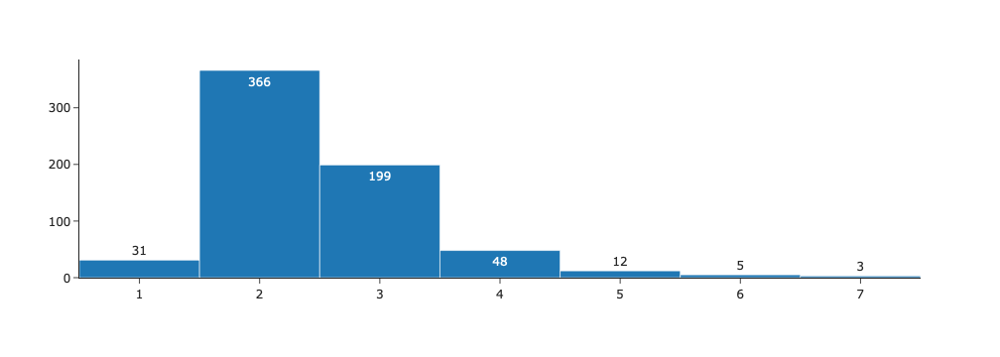

In [94]:
#BOOKINGS
#Visualize the distribution of nights by histogram in plotly
import plotly.express as px
fig = px.histogram(search_EUR[search_EUR['conversion'] == 1], x='nights', template='simple_white', text_auto=True)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

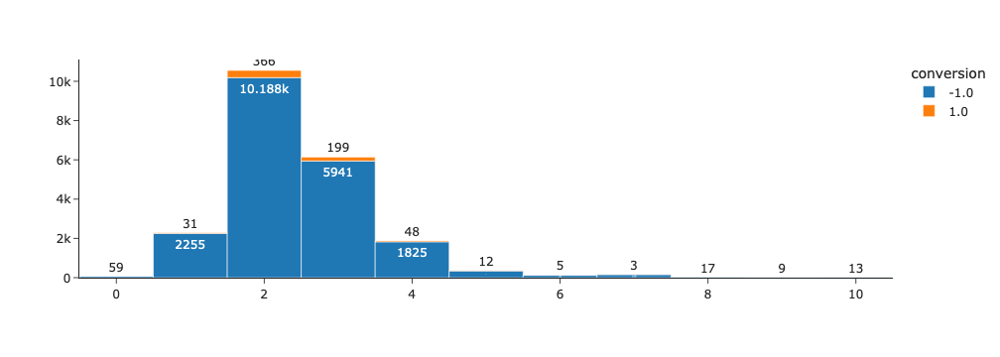

In [96]:
#ALL SEARCH
#Visualize the distribution of nights by conversion
import plotly.express as px
fig = px.histogram(search_EUR[search_EUR['nights'] <= 10], x='nights', color='conversion', template='simple_white', text_auto=True, nbins=20)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()


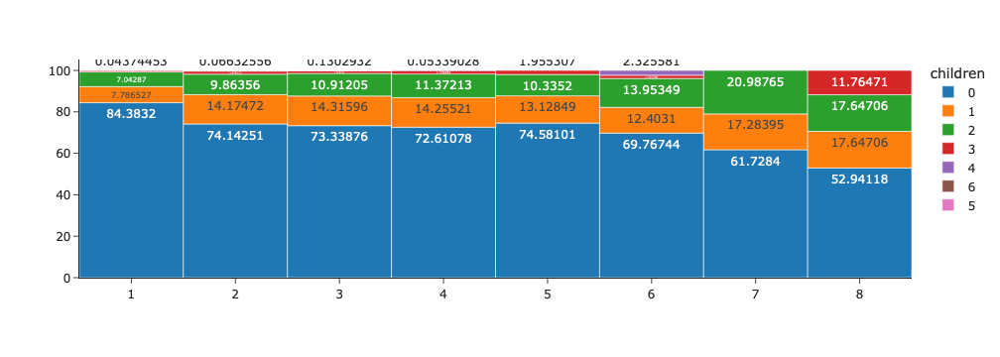

In [98]:
# ALL SEARCH
#Visualize the distribution of nights by the number of children 
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 8) ]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='children',
                   template='simple_white',
                   barnorm='percent', 
                   text_auto=True,
                   nbins=14)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

#Result: the ratio of the guests with children is increasing along with the number of nights

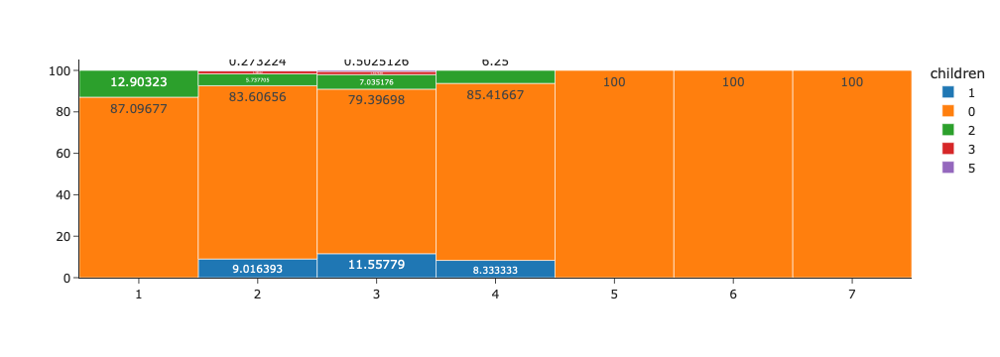

In [100]:
#ONLY THE BOOKINGS
#Visualize the distribution of nights by the number of children -
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 8) & (search_EUR['conversion'] == 1)]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='children',
                   template='simple_white',
                   barnorm='percent', 
                   text_auto=True,
                   nbins=12)
fig.update_layout(xaxis_title=None, yaxis_title=None)

fig.show()

#The guests with children do not stay longer than 4 nights

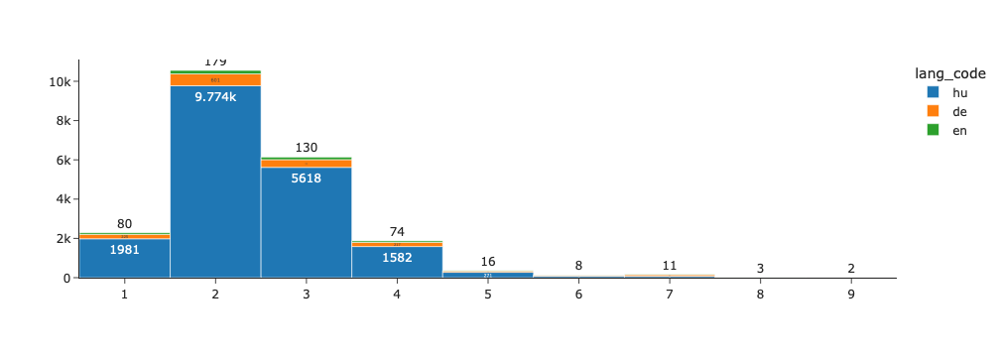

In [102]:
#ALL SEARCH
#Visualize the distribution of nights: split by hu/de/en 
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 9) ]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='lang_code',
                   template='simple_white',
                   #barnorm='percent', 
                   text_auto=True,
                   nbins=14)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

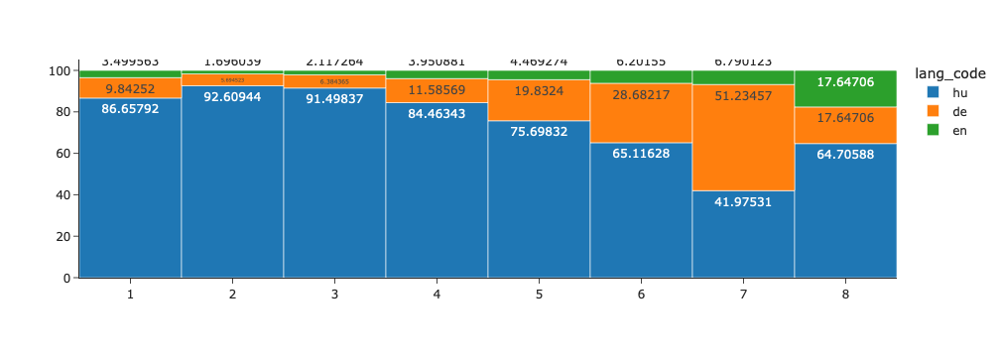

In [104]:
#  ALL SEARCH
#Visualize the searches by distribution of nights: split by hu/de/en ALL SEARCH
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 8) ]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='lang_code',
                   template='simple_white',
                   barnorm='percent', 
                   text_auto=True,
                   nbins=14)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

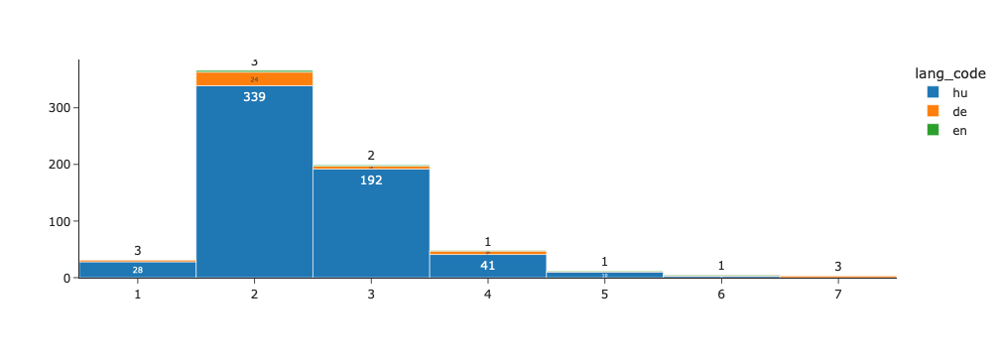

In [106]:
#ONLY BOOKINGS
#Visualize the distribution of nights: split by hu/de/en 
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 9) & (search_EUR['conversion'] == 1)]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='lang_code',
                   template='simple_white',
                   #barnorm='percent', 
                   text_auto=True,
                   nbins=12)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

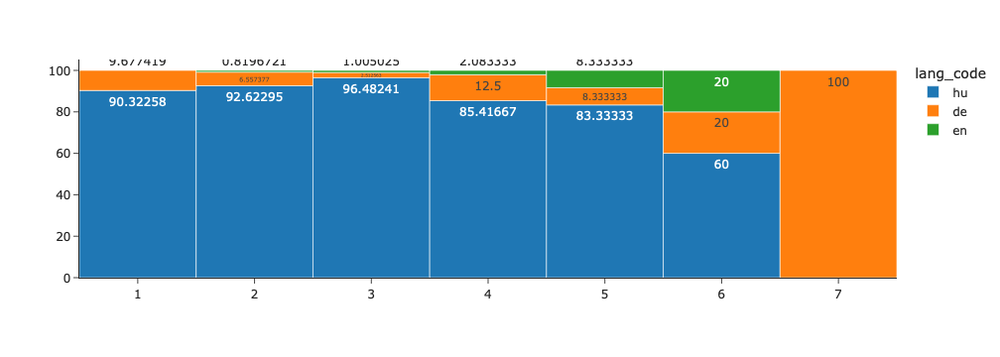

In [108]:
#ONLY BOOKINGS
#Visualize the distribution of nights: split by hu/de/en 
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 9) & (search_EUR['conversion'] == 1)]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='lang_code',
                   template='simple_white',
                   barnorm='percent', 
                   text_auto=True,
                   nbins=12)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()


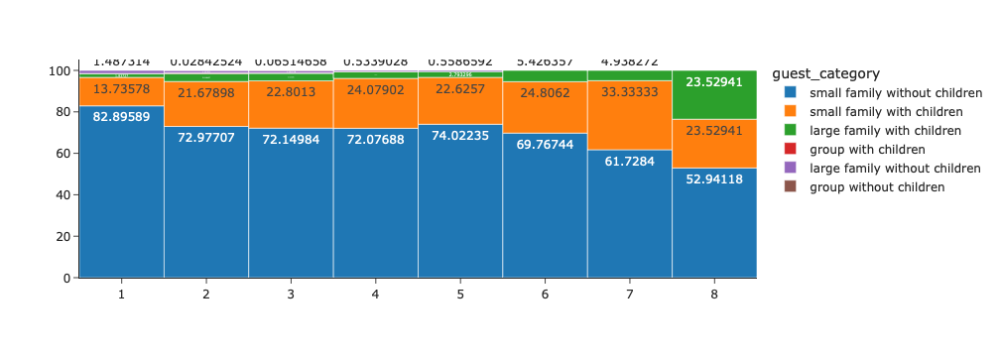

In [110]:
#  ALL SEARCH
#Visualize the searches by distribution of nights: split by number of guests
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 8) ]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='guest_category',
                   template='simple_white',
                   barnorm='percent', 
                   text_auto=True,
                   nbins=14)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

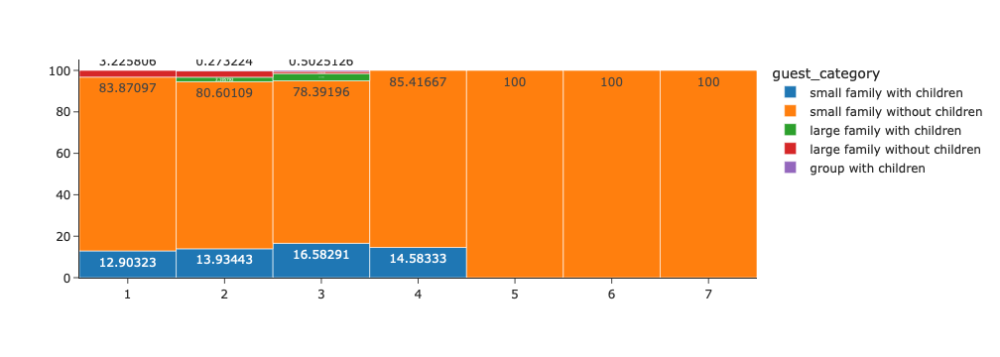

In [112]:
#  BOOKINGS
#Visualize the searches by distribution of nights: split by number of guests
df = search_EUR[ (search_EUR['nights'] != 0) & (search_EUR['nights'] <= 8) & (search_EUR['conversion'] == 1)]
import plotly.express as px
fig = px.histogram(df,
                   x='nights',
                   color='guest_category',
                   template='simple_white',
                   barnorm='percent', 
                   text_auto=True,
                   nbins=12)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

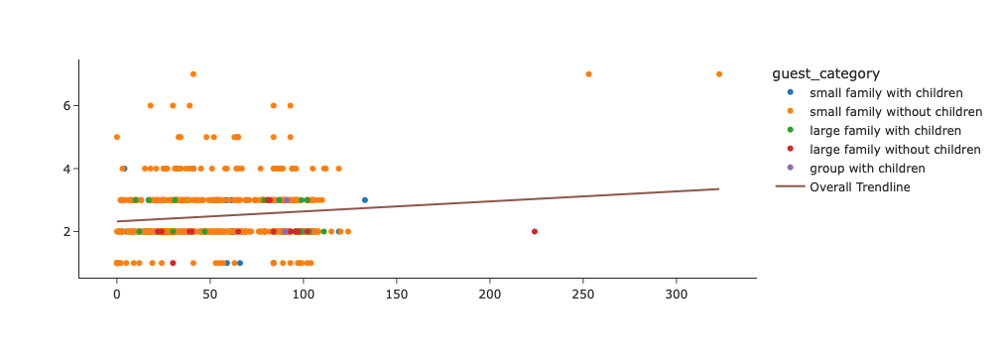

In [114]:
#Question: Do people plan their longer holidays further in advance compared to shorter holidays?
#Visualize : number of nights vs lead time when bookings realized
df = search_EUR[search_EUR['conversion'] == 1]
import plotly.express as px
fig = px.scatter(df, x='lead_time_days', y='nights', trendline="ols", trendline_scope="overall",
                   color='guest_category',
                   template='simple_white',
                   #barnorm='percent', 
                   #text_auto=True,
                   )
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

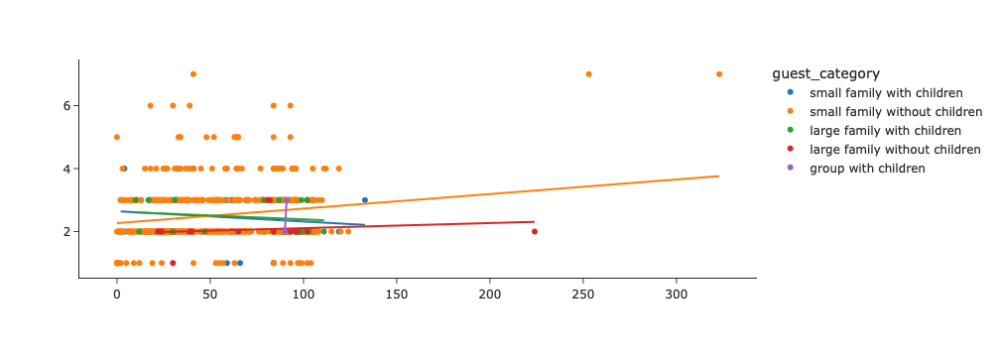

In [116]:
#Question: Do people plan their longer holidays further in advance compared to shorter holidays?
#Visualize : number of nights vs lead time when bookings realized
df = search_EUR[search_EUR['conversion'] == 1]
import plotly.express as px
fig = px.scatter(df, x='lead_time_days', y='nights', trendline="ols",
                   color='guest_category',
                   template='simple_white',
                   #barnorm='percent', 
                   #text_auto=True,
                   )
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()



### Average number of guests per booking


In [118]:
#The average number of guest per search: 2.57
search_EUR['total_guests'].sum() / len(search_EUR)

2.571738628492265

In [120]:
# The average number of guest per booking: 2.07
search_EUR[search_EUR['conversion'] == 1]['total_guests'].sum() / 802

2.06857855361596

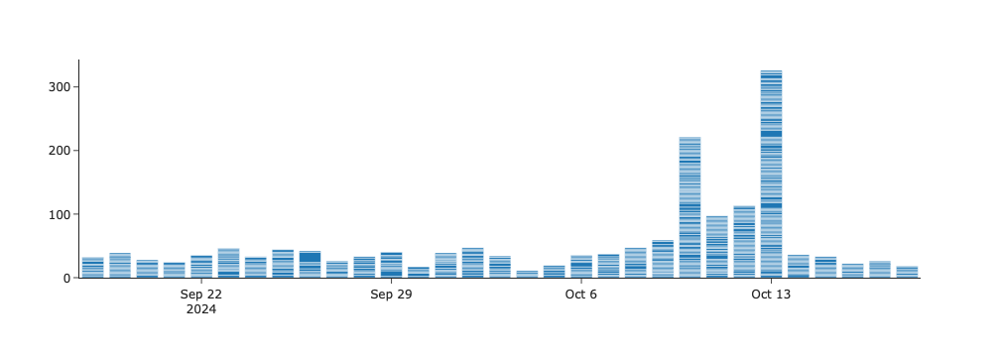

In [122]:
df = search_EUR[search_EUR['conversion'] == 1]
bar = px.bar (df, x='utc_date', y='total_guests', barmode='group', template = 'simple_white')
bar.update_layout(xaxis_title=None, yaxis_title=None)
bar.show()

In [124]:
data = search_EUR[search_EUR['conversion'] == 1]
data_1 = data[['utc_date', 'total_guests']].groupby('utc_date').sum().reset_index()


In [126]:
data2 = search_EUR[search_EUR['conversion'] == 1]
data_2 = data2[['utc_date', 'arrival']].groupby('utc_date').count().reset_index()


In [128]:
#Merge the 2 aggregated tables:
avg_guests = pd.concat([data_1, data_2], axis=1)
avg_guests['avg_guests_daily'] = avg_guests['total_guests'] / avg_guests['arrival']

In [130]:
avg_guests.columns

Index(['utc_date', 'total_guests', 'utc_date', 'arrival', 'avg_guests_daily'], dtype='object')

In [132]:
avg_guests.columns = ['date', 'total_guests', 'utc_date', 'bookings', 'avg_guests_daily']

In [134]:
avg_guests

,date,total_guests,utc_date,bookings,avg_guests_daily
0,2024-09-18,32,2024-09-18,13,2.461538
1,2024-09-19,39,2024-09-19,18,2.166667
2,2024-09-20,28,2024-09-20,12,2.333333
3,2024-09-21,24,2024-09-21,11,2.181818
4,2024-09-22,35,2024-09-22,14,2.500000
5,2024-09-23,46,2024-09-23,19,2.421053
6,2024-09-24,33,2024-09-24,14,2.357143
7,2024-09-25,44,2024-09-25,16,2.750000
8,2024-09-26,42,2024-09-26,11,3.818182
9,2024-09-27,26,2024-09-27,11,2.363636


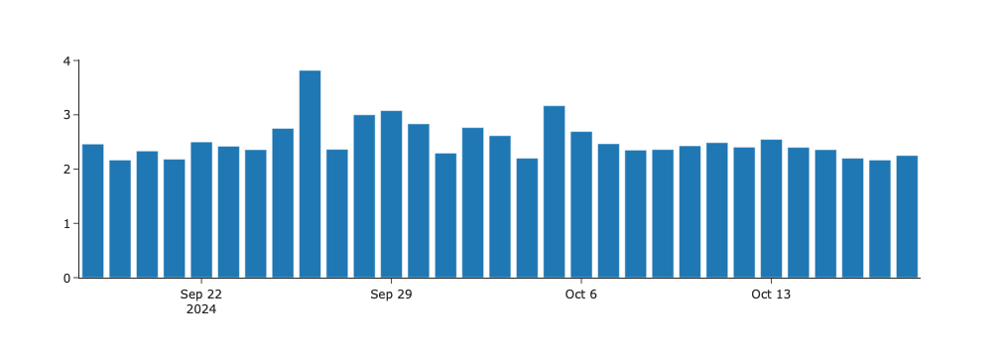

In [136]:
#Average number of guests per bookings by days
df = avg_guests
bar = px.bar (df, x='utc_date', y='avg_guests_daily', barmode='group', template = 'simple_white')
bar.update_layout(xaxis_title=None, yaxis_title=None)
bar.show()

### What periods were searched for during this time period?

In [138]:
search_EUR.iloc[:, 8:18].head()

,nights,adults,children,conversion,total_price_final,utc_date,Rate_EUR,Date_EUR_HUF,total_price_HUF,lead_time
0,2,2,0,-1.0,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days
1,2,2,0,-1.0,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days
2,2,2,0,-1.0,0.0,2024-09-18,394.47,2024-09-18,0.0,30 days
3,3,2,0,-1.0,0.0,2024-09-18,394.47,2024-09-18,0.0,54 days
4,3,2,0,-1.0,0.0,2024-09-18,394.47,2024-09-18,0.0,54 days


In [65]:
search_EUR.iloc[0,11]

-1.0

In [140]:
search_EUR['arrival'] = pd.to_datetime(search_EUR['arrival'])

In [142]:
#Collect the dates which were searched for
dates = []
for i in range(len(search_EUR)):
    if search_EUR.iloc[i, 8] == 1:
        dates.append(search_EUR.iloc[i, 5])
    elif search_EUR.iloc[i, 8] > 1:
        dates.append(search_EUR.iloc[i, 5])
        x = search_EUR.iloc[i, 8]
        for j in range(1, x):
            dates.append(search_EUR.iloc[i, 5] + pd.Timedelta(days=j))

In [144]:
len(dates) #54183 dates were searched

54183

In [146]:
dates_df = pd. DataFrame(dates, columns = ['dates'])

In [148]:
dates_df.head()

,dates
0,2024-10-18
1,2024-10-19
2,2024-10-18
3,2024-10-19
4,2024-10-18


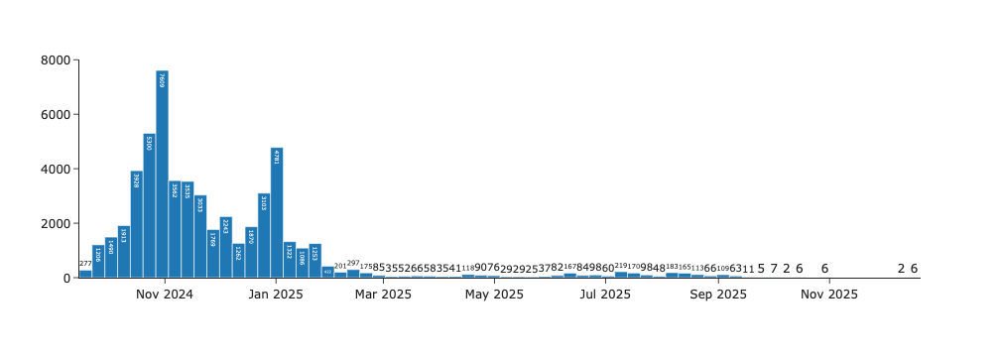

In [150]:
#ALL SEARCH
#Visualize the distribution of these dates

import plotly.express as px
fig = px.histogram(dates_df,
                   x='dates',
                   
                   template='simple_white',
                    
                   text_auto=True,
                   nbins=120)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

In [152]:
search_bookings = search_EUR[search_EUR['conversion'] == 1] #664 bookings

In [156]:
search_bookings

,id,search_log_session_id,utc_datetime,lang_code,currency,arrival,departure,days,nights,adults,...,total_price_final,utc_date,Rate_EUR,Date_EUR_HUF,total_price_HUF,lead_time,lead_time_numbers,lead_time_days,total_guests,guest_category
99,129640,4309,2024-09-18 06:31:59,hu,HUF,2024-11-19,2024-11-22,4,3,2,...,161892.00,2024-09-18,394.47,2024-09-18,161892.000,62 days,5356800000000000,62,3,small family with children
107,129649,4329,2024-09-18 06:40:34,hu,HUF,2024-10-20,2024-10-22,3,2,1,...,82653.20,2024-09-18,394.47,2024-09-18,82653.200,32 days,2764800000000000,32,2,small family with children
181,129730,4381,2024-09-18 08:51:24,hu,HUF,2024-10-06,2024-10-08,3,2,2,...,85117.00,2024-09-18,394.47,2024-09-18,85117.000,18 days,1555200000000000,18,2,small family without children
218,129772,4414,2024-09-18 09:43:21,hu,HUF,2024-10-30,2024-11-01,3,2,2,...,1700.00,2024-09-18,394.47,2024-09-18,1700.000,42 days,3628800000000000,42,2,small family without children
328,129888,4488,2024-09-18 12:58:22,hu,HUF,2024-10-29,2024-10-31,3,2,2,...,177358.00,2024-09-18,394.47,2024-09-18,177358.000,41 days,3542400000000000,41,3,small family with children
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21224,162727,28811,2024-10-18 12:50:36,en,EUR,2024-11-07,2024-11-10,4,3,2,...,760.92,2024-10-18,400.05,2024-10-18,304406.046,20 days,1728000000000000,20,2,small family without children
21284,162789,28786,2024-10-18 13:35:35,hu,HUF,2025-01-17,2025-01-19,3,2,2,...,88128.00,2024-10-18,400.05,2024-10-18,88128.000,91 days,7862400000000000,91,2,small family without children
21403,162914,28920,2024-10-18 15:49:02,hu,HUF,2024-11-15,2024-11-17,3,2,2,...,262336.00,2024-10-18,400.05,2024-10-18,262336.000,28 days,2419200000000000,28,2,small family without children
21612,163127,29045,2024-10-18 20:15:16,hu,HUF,2024-12-16,2024-12-19,4,3,2,...,193489.00,2024-10-18,400.05,2024-10-18,193489.000,59 days,5097600000000000,59,3,small family with children


In [158]:
#BOOKINGS
#Collect the dates which were booked for
book_dates = []
for i in range(len(search_bookings)):
    if search_bookings.iloc[i, 8] == 1:
        book_dates.append(search_bookings.iloc[i, 5])
    elif search_bookings.iloc[i, 8] > 1:
        book_dates.append(search_bookings.iloc[i, 5])
        x = search_bookings.iloc[i, 8]
        for j in range(1, x):
            book_dates.append(search_bookings.iloc[i, 5] + pd.Timedelta(days=j))

In [160]:
len(book_dates) #1663 nights were booked

1663

In [162]:
booking_dates_df = pd. DataFrame(book_dates, columns = ['dates'])

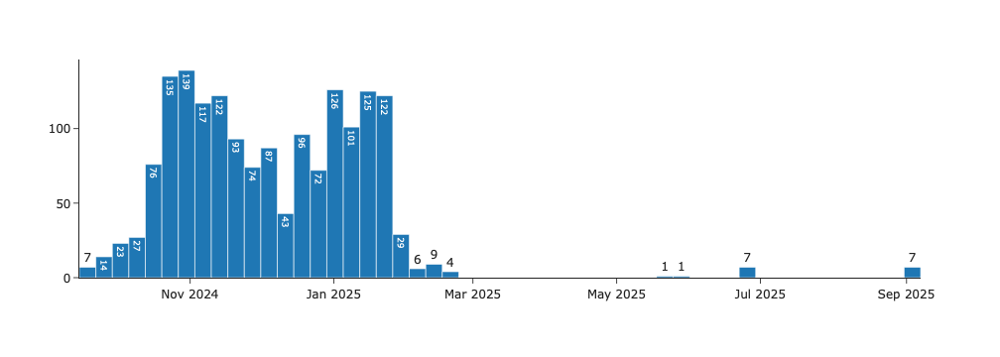

In [164]:
#BOOKINGS - WEEKS
#Visualize the distribution of these bookings - bin size = 80 means one bin is equal one week

import plotly.express as px
fig = px.histogram(booking_dates_df,
                   x='dates',
                   #color='guest_category',
                   template='simple_white',
                   #barnorm='percent', 
                   text_auto=True,
                   nbins=80)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

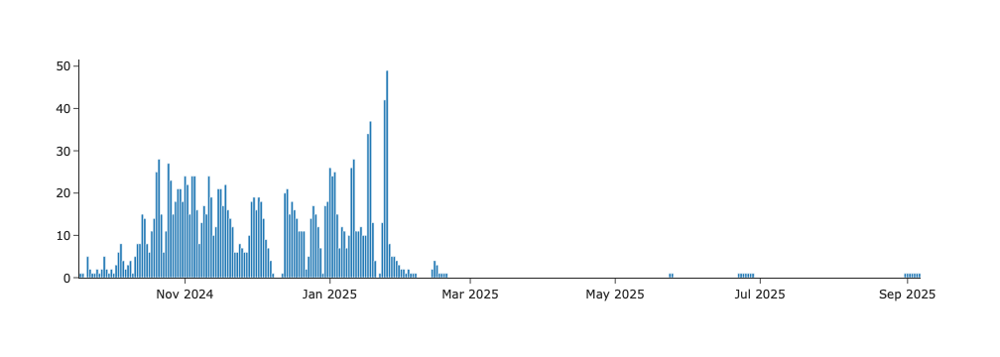

In [166]:
#BOOKINGS - DAYS
#Visualize the distribution of these bookings - bin size = 400 means one bin is one week

import plotly.express as px
fig = px.histogram(booking_dates_df,
                   x='dates',
                   #color='guest_category',
                   template='simple_white',
                   #barnorm='percent', 
                   #text_auto=True,
                   nbins=400)
fig.update_layout(xaxis_title=None, yaxis_title=None)
fig.show()

#This granularity shows better the weekends peaks, where weekend means Friday/Saturday nights

In [168]:
#booking_dates_df
booking_dates_df.head()
booking_dates_df['count'] = 1
booking_dates_df.groupby('dates').count().head(20)

,count
dates,
2024-09-18,1
2024-09-19,1
2024-09-21,5
2024-09-22,2
2024-09-23,1
2024-09-24,1
2024-09-25,2
2024-09-26,1
2024-09-27,2


In [170]:
#occupancy table! here
occupancy = pd.read_csv('./../Morgens_notebooks/HOTEL_3/Original_data/daily_occupancy_hotel_3.csv', sep=";")
occupancy['recording_date'] = pd.to_datetime(occupancy['recording_date'])
occupancy['subject_date'] = pd.to_datetime(occupancy['subject_date'])
occupancy.tail()

,recording_date,subject_date,fill_rate
10783,2024-10-18,2025-08-27,2.632
10784,2024-10-18,2025-08-28,2.632
10785,2024-10-18,2025-08-29,0.000
10786,2024-10-18,2025-08-30,0.000
10787,2024-10-18,2025-08-31,19.298


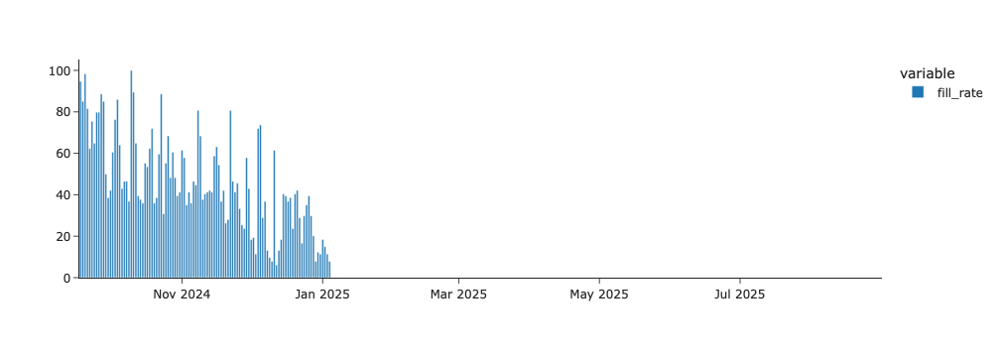

In [172]:
#Show me the occupancy rate in the first day of the period, on 2024-09-18
df = occupancy[['subject_date', 'fill_rate']].iloc[0:348, :]
df
#Visualize
bar = px.bar (df, x = 'subject_date', y=['fill_rate'],  template = 'simple_white')

bar.update_layout(xaxis_title=None, yaxis_title=None)

bar.show()

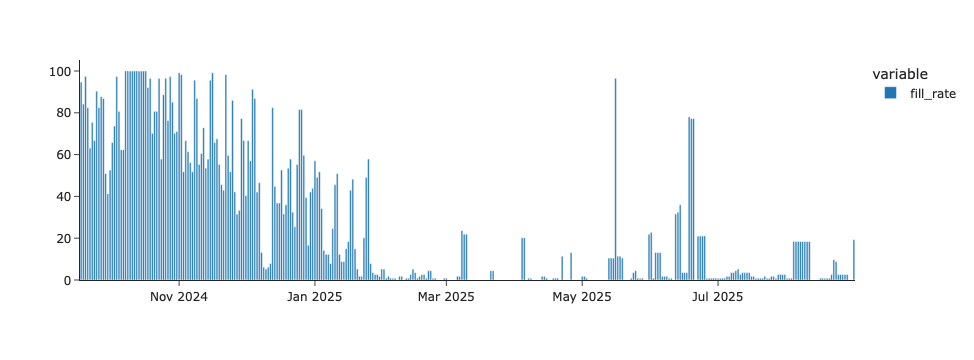

In [174]:
#Show me the occupancy rate in the last day of the period, on 2024-10-18
df = occupancy[['subject_date', 'fill_rate']].iloc[10440:10788, :]
df
#Visualize
bar = px.bar (df, x = 'subject_date', y=['fill_rate'],  template = 'simple_white')

bar.update_layout(xaxis_title=None, yaxis_title=None)

bar.show()

### Analysis of campaigns

- data for campaigns are on these tables: session, datepickers, dailyusers
- the session table can be connected to the search table from where you can know which search resulted in booking
- search_EUR table: search table converted by HUF/EUR: search_EUR.to_csv('/Users/hb/Documents/Morgens/Data/HOTEL_1/Original_data/search_EUR.csv')
- 

#### Daily users table

In [176]:
#daily_users tábla: from which source how many users arrived to the hotel's website
daily_users = pd.read_csv('./../Morgens_notebooks/HOTEL_3/Original_data/website_daily_users_hotel_3.csv', sep=";", encoding='latin-1')
#datatype change to date
daily_users['date'] = pd.to_datetime(daily_users['date'])

In [178]:
#Before dropping of rows
len(daily_users)

1661

In [180]:
#Before dropping of rows - HOTEL 3 campaign sources
daily_users['utm_campaign'].unique()

array(['(not set)', '(direct)', '(organic)', 'HU | pMAX | PERF I Brand',
       'HU | GSN | PERF I Brand', 'campaign_19', 'campaign_20',
       'campaign_21', 'campaign_22', 'campaign_2', 'campaign_23',
       'campaign_24', 'DE | pMAX | PERF I Brand', '(referral)',
       'campaign_25', 'campaign_10', 'campaign_5', 'campaign_26',
       "HU | GDN | ENGM I Programok '24", 'proposal-by-phone',
       'campaign_27', 'campaign_28', 'hirlevel_c1', 'campaign_29',
       'HU | PERF | Lokáció - All', "HU | pMAX | Brand '23/'24",
       'hirlevel_c2', 'loyalty-email', 'AT | PERF | Brand', 'campaign_30',
       '(not+set)', 'campaign_31', 'campaign_14', 'DE | GSN | Lokáció',
       'DE | PERF | Lokáció', 'campaign_32', 'campaign_1', 'hirlevel_c4',
       'campaign_33', 'HU | PERF | Desztináció', 'campaign_34',
       'campaign_35', 'campaign_36', 'HU | GSN | Brand',
       'HU | GSN | Lokáció - All', 'campaign_37', 'campaign_12',
       'campaign_7', 'campaign_38', 'campaign_15', 'DE | PERF | B

In [90]:
#THESE ARE FOR HOTEL 1:
#Delete those lines which DO NOT refer to a campaign or a 'hirlevel':
indexCampaign = daily_users[(daily_users['utm_campaign'] == '(not set)') | (
    daily_users['utm_campaign'] == '(not set)') | (
    daily_users['utm_campaign'] == '(direct)') | (
    daily_users['utm_campaign'] == '(organic)') | (
    daily_users['utm_campaign'] == '(referral)') | (
    daily_users['utm_campaign'] == 'proposal-by-phone') | (
    daily_users['utm_campaign'] == '(not+set)') | (
    daily_users['utm_campaign'] == 'HU') | (
    daily_users['utm_campaign'] == 'teszt') | (
    daily_users['utm_campaign'] == 'linktree') | (
    daily_users['utm_campaign'] == 'AT') ].index
daily_users.drop(indexCampaign, inplace=True)

In [91]:
#After dropping
len(daily_users)

860

In [92]:
#After dropping
daily_users['utm_campaign'].unique()

array(['campaign_14', 'hu_brand', 'campaign_15', 'campaign_16',
       'campaign_17', 'hu_pmax_brand', 'campaign_18', 'campaign_19',
       'campaign_20', 'campaign_2', 'campaign_22', 'campaign_21',
       'campaign_24', 'campaign_23', 'campaign_25', 'campaign_36',
       'campaign_9', 'campaign_26', 'campaign_28', 'utm_campaign',
       'campaign_27', 'campaign_37', 'campaign_30', 'campaign_29',
       'campaign_13', 'campaign_33', 'hirlevel_c3', 'campaign_8',
       'campaign_31', 'campaign_6', 'campaign_32', 'campaign_4',
       'campaign_34', 'campaign_38', 'campaign_39', 'campaign_35',
       'campaign_40', 'campaign_1', 'campaign_41', 'campaign_7',
       'campaign_58', 'loyalty-email', 'campaign_44', 'campaign_42',
       'campaign_43', 'campaign_45', 'campaign_46', 'campaign_47',
       'campaign_48', 'hirlevel_c6', 'hirlevel_c9', 'campaign_51',
       'hirlevel_c5', 'campaign_53', 'campaign_54', 'hirlevel_c10',
       'campaign_55', 'campaign_57', 'campaign_56'], dtype=object)

In [93]:
pivot_daily_users_campaign = daily_users.pivot_table(
    index='date',          # Rows: unique dates
    columns='utm_campaign', # Columns: categories in the "source" column
    values='user_count',   # Values: sum of user_count
    aggfunc='sum',         # Aggregation: sum
    fill_value=0           # Replace NaN with 0 for missing values
)

In [94]:
pivot_daily_users_campaign.columns

Index(['campaign_1', 'campaign_13', 'campaign_14', 'campaign_15',
       'campaign_16', 'campaign_17', 'campaign_18', 'campaign_19',
       'campaign_2', 'campaign_20', 'campaign_21', 'campaign_22',
       'campaign_23', 'campaign_24', 'campaign_25', 'campaign_26',
       'campaign_27', 'campaign_28', 'campaign_29', 'campaign_30',
       'campaign_31', 'campaign_32', 'campaign_33', 'campaign_34',
       'campaign_35', 'campaign_36', 'campaign_37', 'campaign_38',
       'campaign_39', 'campaign_4', 'campaign_40', 'campaign_41',
       'campaign_42', 'campaign_43', 'campaign_44', 'campaign_45',
       'campaign_46', 'campaign_47', 'campaign_48', 'campaign_51',
       'campaign_53', 'campaign_54', 'campaign_55', 'campaign_56',
       'campaign_57', 'campaign_58', 'campaign_6', 'campaign_7', 'campaign_8',
       'campaign_9', 'hirlevel_c10', 'hirlevel_c3', 'hirlevel_c5',
       'hirlevel_c6', 'hirlevel_c9', 'hu_brand', 'hu_pmax_brand',
       'loyalty-email', 'utm_campaign'],
      dtype='

In [95]:
daily_users['user_count'].sum() #20793

20793

In [96]:
#total user_count sum=  20793
campaigns_sum = []
for i in range(1, len(pivot_daily_users_campaign.columns)):
    campaigns_sum.append(pivot_daily_users_campaign.iloc[:,i].sum())



In [97]:
pivot_daily_users_campaign.columns

Index(['campaign_1', 'campaign_13', 'campaign_14', 'campaign_15',
       'campaign_16', 'campaign_17', 'campaign_18', 'campaign_19',
       'campaign_2', 'campaign_20', 'campaign_21', 'campaign_22',
       'campaign_23', 'campaign_24', 'campaign_25', 'campaign_26',
       'campaign_27', 'campaign_28', 'campaign_29', 'campaign_30',
       'campaign_31', 'campaign_32', 'campaign_33', 'campaign_34',
       'campaign_35', 'campaign_36', 'campaign_37', 'campaign_38',
       'campaign_39', 'campaign_4', 'campaign_40', 'campaign_41',
       'campaign_42', 'campaign_43', 'campaign_44', 'campaign_45',
       'campaign_46', 'campaign_47', 'campaign_48', 'campaign_51',
       'campaign_53', 'campaign_54', 'campaign_55', 'campaign_56',
       'campaign_57', 'campaign_58', 'campaign_6', 'campaign_7', 'campaign_8',
       'campaign_9', 'hirlevel_c10', 'hirlevel_c3', 'hirlevel_c5',
       'hirlevel_c6', 'hirlevel_c9', 'hu_brand', 'hu_pmax_brand',
       'loyalty-email', 'utm_campaign'],
      dtype='

In [98]:
[['campaign_14', 'campaign_15', 'campaign_16', 'campaign_17', 'campaign_18','campaign_20', 'hu_brand', 'hu_pmax_brand']]

[['campaign_14',
  'campaign_15',
  'campaign_16',
  'campaign_17',
  'campaign_18',
  'campaign_20',
  'hu_brand',
  'hu_pmax_brand']]

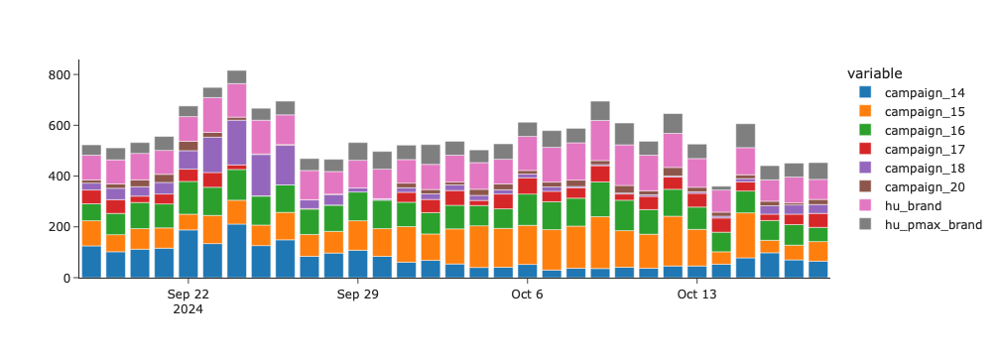

In [99]:
#Visualize the user_count of campaign in the daily user table: only the significant campaigns

bar = px.bar (pivot_daily_users_campaign, x=pivot_daily_users_campaign.index, y=['campaign_14',
                                                                                 'campaign_15',
                                                                                'campaign_16',
                                                                                'campaign_17',
                                                                                'campaign_18',
                                                                                'campaign_20',
                                                                                'hu_brand',
                                                                                'hu_pmax_brand'],
            template = 'simple_white') 
                                                      
bar.update_layout(xaxis_title=None, yaxis_title=None)
bar.show()

#### Datepickers table

In [184]:
#datepickers in the period of 31 days
datepickers = pd.read_csv('./../Morgens_notebooks/HOTEL_3/Original_data/datepicker_daily_visitors_hotel_3.csv', sep=";", encoding='latin-1')
datepickers['date'] = pd.to_datetime(datepickers['date'])

In [194]:
datepickers['utm_campaign'].unique()

array(['(organic)', '(direct)', 'HU | GSN | PERF I Brand',
       'HU | pMAX | PERF I Brand', '(not set)', 'campaign_19',
       'campaign_20', 'campaign_21', '(referral)', 'campaign_22',
       'campaign_26', 'campaign_25', 'campaign_28', 'hirlevel_c1',
       'campaign_24', 'DE | pMAX | PERF I Brand', 'campaign_27',
       'campaign_23', 'campaign_29', 'campaign_5', 'campaign_2',
       "HU | GDN | ENGM I Programok '24", 'HU | PERF | Lokáció - All',
       'hirlevel_c4', 'loyalty-email', 'proposal-by-phone',
       'HU | GSN | Brand', 'campaign_37', 'hirlevel_c2', 'campaign_7',
       'AT | PERF | Brand', 'HU | PERF | Desztináció', 'campaign_30',
       'campaign_33', 'campaign_15', 'campaign_10', 'campaign_12',
       'campaign_39', 'campaign_14', 'HU | PERF | Brand', 'campaign_1',
       'teszt', 'HU | PERF I Brand', 'AT | PERF I Brand', 'hirlevel_c5',
       'campaign_40', 'HU | GSN | Desztináció', 'hirlevel_c6'],
      dtype=object)

#### Booking and session table

In [190]:
#booking and session table
session = pd.read_csv('./../Morgens_notebooks/HOTEL_3/Original_data/search_log_session_hotel_3.csv', sep=";", encoding='latin-1')
booking_search = pd.read_csv('/./../Morgens_notebooks/HOTEL_3/Clean_data/booking_search.csv', index_col = [0])

In [105]:
#if the utm_medium == cpc, than utm_campaign=campaign
session[session['utm_medium'] != 'cpc'].head(50) #if the utm_medium == cpc, than utm_campaign=campaign
for i in range(len(session)):
    if session.iloc[i, 4] == 'cpc':
        session.iloc[i, 5] = 'campaign'
 

In [192]:
session['utm_campaign'].unique()

array(['(not set)', 'campaign_1', 'hu_brand', 'campaign_2', 'HU ',
       'hirlevel_c1', 'campaign_4', 'campaign_5', 'campaign_6', nan,
       '(not+set)', 'AT ', 'campaign_7', 'hu_pmax_brand', 'campaign_8',
       'hirlevel_c2', 'campaign_10', 'campaign_11', 'campaign_12',
       'hirlevel_c3', 'campaign_14', 'campaign_15', 'DE ', 'campaign_16',
       'teszt', 'loyalty-email', 'proposal-by-phone', 'hirlevel_c4',
       'feliratkozas_hu', 'hirlevel_c5',
       'HU I PERF I Display I Fagus lombhullás', 'hirlevel_c6'],
      dtype=object)

In [107]:
session.head(1)

,id,uuid,session_id,utm_source,utm_medium,utm_campaign
0,4034,1145549807.1726611234,1726611549,NaN,NaN,(not set)


In [108]:
booking_search.head(1)

,search_log_id,rooms_total_price,upsell_total_price,vouchers_total_price,loyalty_discount_total,search_log_session_id,lang_code,currency,arrival,departure,days,nights,adults,children,utc_date,Rate_EUR,total_price_HUF
0,112857,119952.2,3500.0,0,11995.2,4205,hu,HUF,2025-02-13,2025-02-15,3,2,2,0,2024-09-18,394.47,99683.0


In [109]:
#join the two tables

booking_session = pd.merge(booking_search, session, left_on='search_log_session_id', right_on='id')
booking_session.head(50)

,search_log_id,rooms_total_price,upsell_total_price,vouchers_total_price,loyalty_discount_total,search_log_session_id,lang_code,currency,arrival,departure,...,children,utc_date,Rate_EUR,total_price_HUF,id,uuid,session_id,utm_source,utm_medium,utm_campaign
0,112857,119952.2,3500.0,0,11995.2,4205,hu,HUF,2025-02-13,2025-02-15,...,0,2024-09-18,394.47,99683.0,4205,545608939.1726639418,1726640510,NaN,NaN,(not set)
1,112906,377114.4,0.0,0,37711.4,4234,hu,HUF,2024-11-07,2024-11-10,...,2,2024-09-18,394.47,302444.0,4234,1548998382.1725447458,1726645636,google,cpc,campaign
2,113050,312877.8,0.0,0,46930.1,4302,en,EUR,2024-10-06,2024-10-10,...,0,2024-09-18,394.47,245530.0,4302,1506793319.1722501130,1726655824,NaN,NaN,(not set)
3,113057,452160.0,0.0,0,45216.0,4315,hu,HUF,2024-10-13,2024-10-19,...,0,2024-09-18,394.47,406944.0,4315,1734792000.1724137767,1726657234,NaN,NaN,(not set)
4,113070,167843.3,0.0,0,27515.3,4321,hu,HUF,2024-11-10,2024-11-12,...,0,2024-09-18,394.47,127885.0,4321,1326858617.1719384033,1726658156,google,cpc,campaign
5,113105,104700.6,0.0,0,11505.6,4339,hu,HUF,2024-11-30,2024-12-02,...,0,2024-09-18,394.47,88195.0,4339,528337376.1724333036,1726660260,google,cpc,campaign
6,113134,281520.0,0.0,0,28152.0,4353,hu,HUF,2024-09-20,2024-09-24,...,0,2024-09-18,394.47,232162.0,4353,1510677266.1716967029,1726662896,(direct),(none),(not set)
7,113151,168912.2,0.0,0,16891.2,4359,hu,HUF,2024-12-06,2024-12-08,...,2,2024-09-18,394.47,147021.0,4359,1011442909.1724665332,1726663463,google,organic,(not set)
8,113152,288206.0,0.0,0,31671.0,4362,hu,HUF,2024-10-31,2024-11-03,...,1,2024-09-18,394.47,251535.0,4362,1058973659.1726570404,1726663881,google,organic,(not set)
9,113256,248121.6,0.0,0,24812.2,4420,en,EUR,2024-09-20,2024-09-22,...,1,2024-09-18,394.47,255403.5,4420,786488170.1726665851,1726673354,(direct),(none),(not set)


In [110]:
len(booking_session[booking_session['utm_campaign'] == 'campaign_2'])

4

In [111]:
booking_session['utm_campaign'].unique()

array(['(not set)', 'campaign', 'proposal-by-phone', 'campaign_4',
       'loyalty-email', 'campaign_7', '(not+set)', 'hirlevel_c5',
       'campaign_2'], dtype=object)

In [112]:
#session table
#these are google campaigns
len(session[session['utm_campaign'] == 'hu_pmax_brand']) #1091
len(session[session['utm_campaign'] == 'hu_brand']) #3028

0

#Questions from Morgens QandA:
- Mi befolyásolja a foglalások dinamikáját?
- Milyem kampányból nem jutnak el a booking enginebe?
- Kik azok aki eljutnak?
- Milyen hatékonyságú a megtérülése ezeknek a kampányoknak?
- Milyen időszakokra kerestek ebben a 31 napban?
- Mi lehet az okda, ha egy időszakra sokan keresnek, de nem érkezik rá foglalás?
- A napi költés változása milyen hatással van a keresésekre és a foglalásokra napi szinten?
- Melyik csatorna járul hozzá a legjobban a bevételhez?
- Melyik kampány teljesített a legjobban?
- vevői szegmentációs szempontok: gyerek/gyerektelen, magyar/külföldi, tartózkodás hossza alapján, upsell alapján,